# Imports used for the project

In [1]:
import csv
import datetime
from cleantext import clean
import re
import numpy as np
import pandas as pd

import psycopg2
from psycopg2 import connect, extensions, sql, Error
from psycopg2.extensions import ISOLATION_LEVEL_AUTOCOMMIT

import scrapy
from scrapy.crawler import CrawlerProcess

import sys
import os

import nltk
from nltk.tokenize import word_tokenize
import string
from nltk.corpus import stopwords

from IPython.display import display, Image

# Task 2 - Load database
### Create csv files that contains the data from the raw data csv file

In [2]:
# Sample
csv_in = 'csv-files/1mio-raw.csv'

In [3]:
def create_empty_file_for_writing(filename):
    if os.path.exists(filename):
        file = open(filename)
        file.close()
        os.remove(filename)
    return open(filename, "w")    

In [4]:
def simple_entity_to_CSV(filename, idName, keyName, dictionary):
    file = open(filename,"a",encoding='utf-8')
    for item in dictionary.items():
        file.write("%s,%s\n" %(str(item[1]), str(item[0])))
    file.close

In [5]:
def clean_text(content):

    # split into words
    tokens = word_tokenize(content)
    
    # convert to lower case
    tokens = [w.lower() for w in tokens]
    
    # remove punctuation from the end of words
    table = str.maketrans('', '', string.punctuation)
    stripped = [w.translate(table) for w in tokens]
    
    # remove remaining tokens that are not alphabetic
    words = [word for word in stripped if word.isalpha()]
    
    # filter out stop words
    stop_words = set(stopwords.words('english'))
    words = [w for w in words if not w in stop_words]
    
    #Join to one string
    seperator = ' '
    clean_text = seperator.join(words)
    
    return clean_text

In [6]:
def isNaN(string):
    return string != string

In [7]:
def extract_and_put_in_csv_files(chunk):
    
    global ID_author
    global ID_domain
    global ID_keyword
    global ID_type 
    global ID_article
    global ID_time
    
    
    for index, row in chunk.iterrows():
        # Authors  
        authors = row['authors']
        if(not isNaN(authors)):
            list_of_authors = authors.split(", ")
            for author in list_of_authors:
                if(len(author) <= 64 and (author not in author_dictionary)):
                    author_dictionary[author] = ID_author
                    ID_author += 1
        
        
        
        # Meta keywords and Tags
        keywords = row['meta_keywords']
        if(not isNaN(keywords)):
            list_of_keywords = list(dict.fromkeys(re.split(r'[;,"\'\[\]]\s*', keywords)))
            for keyword in list_of_keywords:
                if(len(keyword) <= 128 and len(keyword) > 0): 
                    if (keyword not in keyword_dictionary):
                        keyword_dictionary[keyword] = ID_keyword
                        csv_tags.write("%s,%s\n" % (ID_article, ID_keyword))
                        ID_keyword += 1
                    else:
                        csv_tags.write("%s,%s\n" % (ID_article, keyword_dictionary.get(keyword)))
        
        
        
        # Domain
        domain = row['domain']
        if(not isNaN(domain)):
            if(len(domain) <= 1024 and (domain not in domain_dictionary)):
                domain_dictionary[domain] = ID_domain
                ID_domain += 1
        
        
        
        # Type
        typ = row['type']
        if(not isNaN(typ)):
            if(len(typ) <= 64 and (typ not in type_dictionary)):
                type_dictionary[typ] = ID_type
                ID_type += 1
        
        
        
        # Time
        scrapped_at_time_id = 0
        scrapped_at = row['scraped_at']
        if(isNaN(scrapped_at)):
            scrapped_at = datetime.datetime(1000, 1, 1)
        if (scrapped_at not in time_dictionary):
            time_dictionary[scrapped_at] = ID_time
            scrapped_at_time_id = ID_time
            ID_time += 1
        else:
            scrapped_at_time_id = time_dictionary.get(scrapped_at)
            
        inserted_at_time_id = 0    
        inserted_at = row['inserted_at']
        if(isNaN(inserted_at)):
            inserted_at = datetime.datetime(1000, 1, 1)
        if (inserted_at not in time_dictionary):
            time_dictionary[inserted_at] = ID_time
            inserted_at_time_id = ID_time
            ID_time += 1
        else:
            inserted_at_time_id = time_dictionary.get(inserted_at)    
            
        updated_at_time_id = 0 
        updated_at  = row['updated_at']
        if(isNaN(updated_at)):
            updated_at = datetime.datetime(1000, 1, 1)
        if (updated_at not in time_dictionary):
            time_dictionary[updated_at] = ID_time
            updated_at_time_id = ID_time
            ID_time += 1
        else:
            updated_at_time_id = time_dictionary.get(updated_at)    
        
        
        
        # Article
        title = row['title']
        if(title and (not isNaN(title)) and (len(title) <= 512)):
            title = clean_text(title)
        else:
            title = "NULL"
        
        content = row['content']
        if(not isNaN(content)):
            content = clean_text(content)
        else:
            content = "NULL"
        
        summary = row['summary']
        if(summary and (not isNaN(summary))):
            summary = clean_text(summary)
        else:
            summary = "NULL"
        
        meta_description = row['meta_description']
        if(meta_description and (not isNaN(meta_description))):
            meta_description = clean_text(meta_description)
        else:
            meta_description = "NULL"
        
        typ = row['type']
        if((not isNaN(typ)) and (len(typ) <= 64)):
            type_id = type_dictionary[typ]
        else:
            type_id = 0

        csv_article.write("%s^\"%s\"^\"%s\"^\"%s\"^\"%s\"^%s^%s^%s^%s\n"%
            (ID_article
             , title
             , content
             , summary
             , meta_description
             , type_id
             , scrapped_at_time_id
             , inserted_at_time_id
             , updated_at_time_id))
        
        
        
        # Webpage
        url = row['url']
        domain = row['domain']
        if((not isNaN(url)) and (not isNaN(domain)) and (len(url) <= 1024) and (len(domain) <= 1024)):
            csv_webpage.write("%s^%s^%s\n" % (ID_article, url, domain_dictionary[domain]))
        
        
        
        # Writen_by
        authors = row['authors']
        if(not isNaN(authors)):
            list_of_authors = authors.split(", ")
            for author in list_of_authors:
                if(len(author) <= 64):
                    csv_written_by.write("%s,%s\n" % (ID_article, author_dictionary[author]))
                    

        ID_article += 1


In [8]:
csv_author     = create_empty_file_for_writing('csv-files/author.csv')
csv_keyword    = create_empty_file_for_writing('csv-files/keyword.csv')
csv_domain     = create_empty_file_for_writing('csv-files/domain.csv')
csv_type       = create_empty_file_for_writing('csv-files/type.csv')
csv_article    = create_empty_file_for_writing('csv-files/article.csv')
csv_written_by = create_empty_file_for_writing('csv-files/written_by.csv')
csv_tags       = create_empty_file_for_writing('csv-files/tags.csv')
csv_webpage    = create_empty_file_for_writing('csv-files/webpage.csv')
csv_time       = create_empty_file_for_writing('csv-files/time.csv')

# Initialize the dictionaries
author_dictionary  = dict()
domain_dictionary  = dict() 
type_dictionary    = dict()
keyword_dictionary = dict()   
time_dictionary    = dict()

# Used to generate ID's in the csv files
ID_author = ID_domain = ID_keyword = ID_type = ID_article = ID_time = 0

# Process and store the stuff 
CHUNK_SIZE = 100000

with open(csv_in, 'r', newline='',encoding='utf-8', errors='replace') as csvfile:
    reader = pd.read_csv(csvfile, chunksize=CHUNK_SIZE,
                         encoding='utf-8',
                         parse_dates=['scraped_at','inserted_at','updated_at'])
    chunk_idx = 1 # Used to see how far the reading process is
    for chunk in reader:
        extract_and_put_in_csv_files(chunk)
        print(str(CHUNK_SIZE * chunk_idx) + " rows have been read.")
        chunk_idx += 1
    
    simple_entity_to_CSV("csv-files/author.csv", "author_id", "author_name", author_dictionary)
    simple_entity_to_CSV("csv-files/keyword.csv", "keyword_id", "keyword_name", keyword_dictionary)
    simple_entity_to_CSV("csv-files/domain.csv", "domain_id", "domain_url", domain_dictionary)    
    simple_entity_to_CSV("csv-files/type.csv", "type_id", "type_name", type_dictionary)
    simple_entity_to_CSV("csv-files/time.csv", "time_id", "time", time_dictionary)
csvfile.close() 

100000 rows have been read.


/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


200000 rows have been read.
300000 rows have been read.
400000 rows have been read.
500000 rows have been read.
600000 rows have been read.
700000 rows have been read.
800000 rows have been read.
900000 rows have been read.
1000000 rows have been read.


### Create database and load it with the data from above

Run the follwoing commands in the terminal to create the database:

sudo -u postgres psql

CREATE DATABASE fakenews;

CREATE USER user123 WITH ENCRYPTED PASSWORD 'pass123';

GRANT ALL PRIVILEGES ON DATABASE FakeNews TO user123;

GRANT pg_read_server_files TO user123;

In [3]:
sql_query_create_and_load_database = """
DROP TABLE IF EXISTS Time, Written_by, Tags, Webpage, Article, Typ, Domain, Author, Keyword CASCADE;


CREATE TABLE Time
(
  time_id serial NOT NULL,
  time timestamp NOT NULL,
  PRIMARY KEY (time_id)
);

CREATE TABLE Typ
(
  type_id serial NOT NULL,
  type_name varchar(64) NOT NULL,
  PRIMARY KEY (type_id),
  UNIQUE (type_name)
);

CREATE TABLE Keyword
(
  keyword_id serial NOT NULL,
  keyword_name varchar(128),
  PRIMARY KEY (keyword_id),
  UNIQUE (keyword_name)
);

CREATE TABLE Author
(
  author_id serial NOT NULL,
  author_name varchar(64) NOT NULL,
  PRIMARY KEY (author_id),
  UNIQUE (author_name)
);

CREATE TABLE Domain
(
  domain_id serial NOT NULL,
  domain_url varchar(1024) NOT NULL,
  PRIMARY KEY (domain_id)
);

CREATE TABLE Article
(
  article_id serial NOT NULL,
  title text NOT NULL,
  content text NOT NULL,
  summary text,
  meta_description text,
  type_id integer NOT NULL,
  inserted_at_time_id integer NOT NULL,
  updated_at_time_id  integer NOT NULL,
  scrapped_at_time_id integer NOT NULL,
  PRIMARY KEY (article_id),
  FOREIGN KEY (inserted_at_time_id) REFERENCES Time(time_id),
  FOREIGN KEY (updated_at_time_id)  REFERENCES Time(time_id),
  FOREIGN KEY (scrapped_at_time_id) REFERENCES Time(time_id),
  FOREIGN KEY (type_id) REFERENCES Typ(type_id)
);

CREATE TABLE Webpage 
(
  article_id integer REFERENCES Article(article_id),
  url varchar(1024),
  domain_id integer REFERENCES Domain(domain_id)
);

CREATE TABLE Tags
(
  article_id integer NOT NULL,
  keyword_id integer NOT NULL,
  PRIMARY KEY (article_id, keyword_id),
  FOREIGN KEY (article_id) REFERENCES Article(article_id),
  FOREIGN KEY (keyword_id) REFERENCES Keyword(keyword_id)
);

CREATE TABLE Written_by
(
  article_id integer NOT NULL,
  author_id integer NOT NULL,
  PRIMARY KEY (article_id, author_id),
  FOREIGN KEY (article_id) REFERENCES Article(article_id),
  FOREIGN KEY (author_id) REFERENCES Author(author_id)
);



COPY time       FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/FakeNewsCorpus/csv-files/time.csv'        DELIMITER ',' CSV;
COPY keyword    FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/FakeNewsCorpus/csv-files/keyword.csv'     DELIMITER ',' CSV;
COPY author     FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/FakeNewsCorpus/csv-files/author.csv'      DELIMITER ',' CSV;
COPY typ        FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/FakeNewsCorpus/csv-files/type.csv'        DELIMITER ',' CSV;
COPY domain     FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/FakeNewsCorpus/csv-files/domain.csv'      DELIMITER ',' CSV;
COPY article    FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/FakeNewsCorpus/csv-files/article.csv'     DELIMITER '^' QUOTE '}' CSV ;
COPY tags       FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/FakeNewsCorpus/csv-files/tags.csv'        DELIMITER ',' CSV;
COPY written_by FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/FakeNewsCorpus/csv-files/written_by.csv'  DELIMITER ',' CSV;
COPY webpage    FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/FakeNewsCorpus/csv-files/webpage.csv'     DELIMITER '^' CSV;"""

In [4]:
# Establishing the connection
conn = psycopg2.connect(
   database="fakenews", user='user123', password='pass123', host='127.0.0.1', port= '5432'
)

# Set the isolation level
conn.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT)

# Creating a cursor object using the cursor() method
cursor = conn.cursor()

# Execute SQL commands
cursor.execute(sql_query_create_and_load_database)

# Close the cursor to avoid memory leaks
cursor.close()

# Close the connection to avoid memory leaks
conn.close()

Login to the database to see that the data has been loaded with the following command:

psql -h localhost -U user123 fakenews

### Explanation of the database design 

Below is a E/R diagram of our database design. 

Our design of our database design was an iterative process, where we started with an databse design and then when we saw some anomalies we changed our design to reduce these. We started by cramming all the data in one relation but this created a lot of anomalies. So by decomposing this iteratively we ended up with the design that can be viewed on the picture below. By designing our database this way, we have reduced redundancy, update anomalies, and deletion anomalies a lot.   

Article:
- As it can be seen from the diagram the central, and most important entity is the Article entity. The article consists of some text attributes including: summary, meta_description, title, and content. It would make sense to split these into entities themselves since for example multiple atricles doesn't have the same content or summaries. It could maybe make sense to have title in an entity since multiple articles could have the same titles. This would maybe save some storage and reduce the redundancy, but we have decided to keep it together since it would make the database more complicated. 
- The article entity also has some id attributes. These are for the data fields where we have a many - one relationship. So for example article has a field called inserted_at_time_id. The reason for this is that one article only has a single time where it was inserted, but multiple articles could be inserted at the same time. So by doing this we save some space and make querying more efficient.

Time:
- In the beginning our Article entity also had scrapped_at, inserted_at, and Updated_at as attributes, but after making some queries we quickly found out that it was the same dates that was used. Therefore we decided to create an time entity with all the various times. This happened to be a good idea since there was only five different times in the dataset. So now the Article entity only has the attributes scrapped_at_time_id, inserted_at_time_id, and updated_at_time_id which are the time id's from the time table. This does that instead of saving a lot of the same dates, we only have to save a lot of the same id's. This reduces update anomalies since we now for example only have to change one date if it was wrong for some reason. It also save space since it is more efficient to store a lot of integers than a lot of timestamps.


Keyword and tags:
- Since many articles have the same keywords and articles have many keywords we decided to split it up into two entities. The keyword entity contains all the different keywords and the tags entity contains article id's and keyword id's. By doing it this way we reduce redundancy. 

Typ:
- We used the same logic for types. Here we initially thought they also should just be an attribute but again there was only 12 different kinds of types.


Author and written_by:
- Like keyword and tags, o an article can have many authors and an author can have written multiple articles. Therefore we have decomposed it. Author contains all the authors and written_by contains article_id and author_id that can be used to link the article to its authors. The reason for this decomposition is because it reduces redundancy. 


Domain and webpage:
- The reason for decomposing the domain into its own relation is that an article can only have one domain, but a domain can have many articles. By decomposing it like this into two relations, we reduce redundancy by a lot.


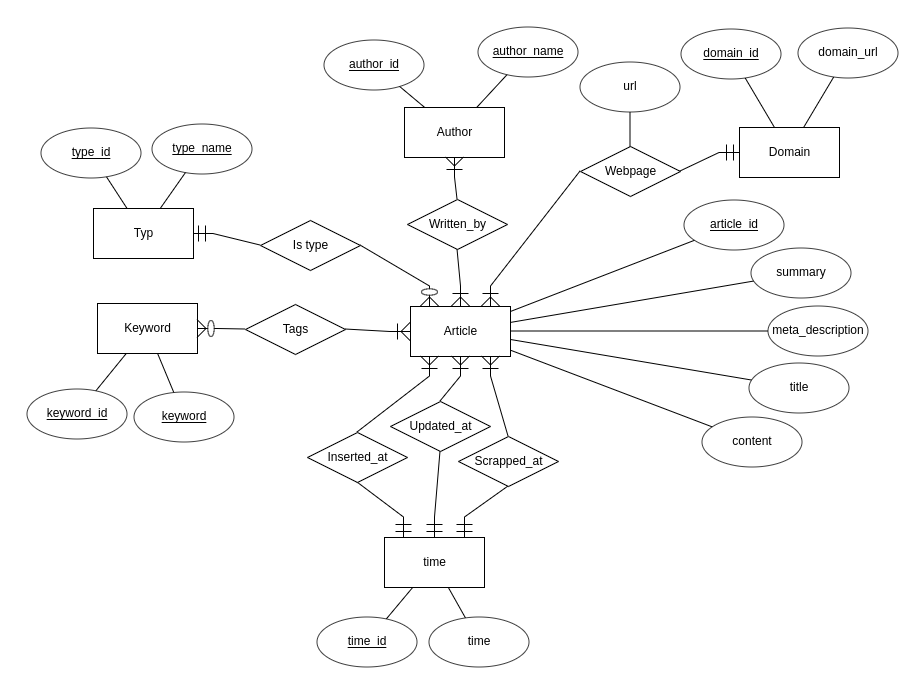

In [5]:
i = Image(filename='ER diagram.png')
display(i)

### Demonstration that our database contains a larger number of rows
We will now show that our database contains a larger number of rows by printing the number of rows in each table in the database.

In [6]:
# SQL commands
sql_query_large_number_of_rows_keyword    = "SELECT COUNT(*) FROM keyword;"
sql_query_large_number_of_rows_author     = "SELECT COUNT(*) FROM author;"
sql_query_large_number_of_rows_domain     = "SELECT COUNT(*) FROM domain;"
sql_query_large_number_of_rows_typ        = "SELECT COUNT(*) FROM typ;"
sql_query_large_number_of_rows_article    = "SELECT COUNT(*) FROM article;"
sql_query_large_number_of_rows_webpage    = "SELECT COUNT(*) FROM webpage;"
sql_query_large_number_of_rows_tags       = "SELECT COUNT(*) FROM tags;"
sql_query_large_number_of_rows_written_by = "SELECT COUNT(*) FROM written_by;"
sql_query_large_number_of_rows_time       = "SELECT COUNT(*) FROM time;"

# Establishing the connection
conn = psycopg2.connect(
   database="fakenews", user='user123', password='pass123', host='127.0.0.1', port= '5432'
)

# Set the isolation level
conn.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT)

# Creating a cursor object using the cursor() method
cursor = conn.cursor()

# Execute SQL commands and print results
cursor.execute(sql_query_large_number_of_rows_keyword)
print("Number of rows in the keyword table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_author)
print("Number of rows in the author table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_domain)
print("Number of rows in the domain table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_typ)
print("Number of rows in the typ table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_article)
print("Number of rows in the article table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_webpage)
print("Number of rows in the webpage table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_tags)
print("Number of rows in the tags table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_written_by)
print("Number of rows in the written_by table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_time)
print("Number of rows in the time table: " + str(cursor.fetchone()[0]))


# Close the cursor to avoid memory leaks
cursor.close()

# Close the connection to avoid memory leaks
conn.close()

Number of rows in the keyword table: 135381
Number of rows in the author table: 57837
Number of rows in the domain table: 394
Number of rows in the typ table: 12
Number of rows in the article table: 999992
Number of rows in the webpage table: 999855
Number of rows in the tags table: 1027217
Number of rows in the written_by table: 2301635
Number of rows in the time table: 5


# Inherent problems with the data while working with it

Some of the fields was empty. We are not sure what the difference between keywords and meta_keywords is.
We are not sure what the difference between updated_at and inserted at is.

We think it is funny that the content has not been looked at when the articles was labeled.

We don't understand what the differnce is between summary and meta_describtion is. 

We don't understand why summary is always empty.

We also had some problems with loading all the data from the csv file. We did work around this by working with the data in chunks where each chunk consists of 100000 articles.

### Demonstration that simple queries works

We will now show that our database supports simple queries. Here we just make some natural joins between some of the tables an so on. 

In [7]:
# SQL commands
simple_sql_query_title_and_type = "SELECT article_id, title, type_name FROM article NATURAL JOIN typ LIMIT 10;"
simple_sql_query_various_types = "SELECT type_name FROM typ;"
simple_sql_query_nr_of_fake_articles = "SELECT COUNT(*) FROM article NATURAL JOIN typ WHERE type_name = 'fake';"

# Establishing the connection
conn = psycopg2.connect(
   database="fakenews", user='user123', password='pass123', host='127.0.0.1', port= '5432'
)

# Set the isolation level
conn.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT)

# Creating a cursor object using the cursor() method
cursor = conn.cursor()

# Execute SQL commands and print results
cursor.execute(simple_sql_query_title_and_type)
print("Get title and type for ten articles:")
for row in cursor.fetchall():
    print("Article id: " + str(row[0]) + ", Title: " + row[1] + ", Type: " + row[2])


cursor.execute(simple_sql_query_various_types)
print("\nThe various types:")
for row in cursor.fetchall():
    print(row[0])

cursor.execute(simple_sql_query_nr_of_fake_articles)
print("\nNumber of articles marked as fake: \n" + str(cursor.fetchone()[0]))

# Close the cursor to avoid memory leaks
cursor.close()

# Close the connection to avoid memory leaks
conn.close()

Get title and type for ten articles:
Article id: 0, Title: "life illusion researchers prove reality nt exist looking", Type: rumor
Article id: 1, Title: "donald trump", Type: hate
Article id: 2, Title: "donald trump", Type: hate
Article id: 3, Title: "winning israeli intelligence source debkafile confirms trump administration cut ties palestinians means peace plan financial aid", Type: hate
Article id: 4, Title: "oh trump coward wait dig grave means islamic caliphate", Type: hate
Article id: 5, Title: "following guatemala decision move embassy jerusalem capital israel countries also considering move", Type: hate
Article id: 6, Title: "unbacked police massacred haitians impunity", Type: unreliable
Article id: 7, Title: "black agenda report", Type: unreliable
Article id: 8, Title: "black agenda report", Type: unreliable
Article id: 9, Title: "zambia must clarify whether host israelafrica summit", Type: unreliable

The various types:
rumor
hate
unreliable
conspiracy
clickbait
satire
fake


# Task 3 - Issuing queries to better understand the characteristics of the data

We will now formulate some queries in various database languages and discuss what we observed when we executed then over our database.

In [8]:
# Establishing the connection
conn = psycopg2.connect(database="fakenews", user='user123', password='pass123', host='127.0.0.1', port= '5432')

# Set the isolation level
conn.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT)

# Creating a cursor object using the cursor() method
cursor = conn.cursor()

### 3.1: List the domains of news articles of reliable type and scrapped at or after January 15, 2018. NOTE: Do not include duplicate domains in your answer. [Languages: relational algebra and SQL]

In [9]:
%%latex
\begin{equation}
\text{Answer(domain)} := \pi_{\text{domain_url}} \left(\sigma_{\text{type_name = 'reliable' AND time} \geq '2018-01-15'} \left(\text{Domain} \bowtie \text{Webpage} \bowtie \text{Article} \bowtie \text{Typ} \thinspace \mathring{\bowtie}_{\text{scrapped_at_time_id = time_id}} \thinspace \text{Time} \right)\right)  
\end{equation}

<IPython.core.display.Latex object>

In [10]:
sql_list_domains_of_reliable_articles = """
SELECT DISTINCT domain_url 
FROM   domain 
       natural JOIN webpage 
       natural JOIN article 
       natural JOIN typ 
       INNER JOIN time 
               ON article.scrapped_at_time_id = time.time_id 
WHERE  type_name = 'reliable' 
       AND time >= '2018-01-15';"""


# Execute SQL command and print result
cursor.execute(sql_list_domains_of_reliable_articles)
print("\nDomains of news articles of reliable type and scrapped at or after January 15, 2018: \n")
for row in cursor.fetchall():
    print("Domain: " + row[0])



Domains of news articles of reliable type and scrapped at or after January 15, 2018: 

Domain: christianpost.com
Domain: consortiumnews.com
Domain: nutritionfacts.org


### 3.2: List the name(s) of the most prolific author(s) of news articles of fake type. An author is among the most prolific if it has authored as many or more fake news articles as any other author in the dataset. [Languages: extended relational algebra and SQL]

In [11]:
%%latex
\begin{equation}
\text{R (a, w)} := \pi_{\text{author_name} \to a, \text{COUNT(author)} \to \text{w}} \left(\sigma_{\text{type_name = 'fake'}} \left(\gamma_{\text{author_name}} \left(\text{Author} \bowtie \text{Written_by} \bowtie \text{Article} \bowtie \text{Typ} \right)\right)\right)\\
\text{max_articles_written_by_any_author} := \pi_{\text{MAX(w)}}(R)\\
\text{Answer(a)} := \pi_{a} \left( \sigma_{\text{w} = \text{max_articles_written_by_any_author}}\left(\text{R}\right) \right) 
\end{equation}

<IPython.core.display.Latex object>

In [12]:
sql_list_names_of_the_most_prolific_authors_of_fake_articles = """
WITH table_author_and_fake_articles 
     AS (SELECT author_name, 
                Count(author) AS fake_articles_written 
         FROM   author 
                natural JOIN written_by 
                natural JOIN article 
                natural JOIN typ 
         WHERE  type_name = 'fake' 
         GROUP  BY author_name) 
SELECT author_name 
FROM   table_author_and_fake_articles 
WHERE  fake_articles_written = (SELECT Max(fake_articles_written) 
                                FROM   table_author_and_fake_articles);"""

# Execute SQL command and print result
cursor.execute(sql_list_names_of_the_most_prolific_authors_of_fake_articles)
print("\nList of the name(s) of the most prolific author(s) of news articles of fake type: \n")
for row in cursor.fetchall():
    print("Author: " + row[0])


List of the name(s) of the most prolific author(s) of news articles of fake type: 

Author: John Rolls


### 3.3: Count the pairs of article IDs that exhibit the exact same set of meta-keywords, but only return the pairs where the set of meta-keywords is not empty. [Language: SQL]

In [13]:
sql_count_the_pairs_of_article_IDs_that_exhibit_the_exact_same_set_of_keywords = """
WITH small_tags 
     AS (SELECT * 
         FROM   tags 
         WHERE  article_id <= 1000), 
     articles_small 
     AS (SELECT DISTINCT article_id 
         FROM   small_tags), 
     pairs_of_article_ids
     AS (SELECT A1.article_id, 
       A2.article_id 
FROM   articles_small A1, 
       articles_small A2 
WHERE  A1.article_id > A2.article_id 
       AND EXISTS (SELECT * 
                   FROM   small_tags 
                   WHERE  A1.article_id = small_tags.article_id) 
       AND NOT EXISTS ((SELECT small_tags.keyword_id 
                        FROM   small_tags 
                        WHERE  A1.article_id = small_tags.article_id
                        AND small_tags.keyword_id != 0) 
                       EXCEPT 
                       (SELECT small_tags.keyword_id 
                        FROM   small_tags 
                        WHERE  A2.article_id = small_tags.article_id)) 
       AND NOT EXISTS ((SELECT small_tags.keyword_id 
                        FROM   small_tags 
                        WHERE  A2.article_id = small_tags.article_id) 
                       EXCEPT 
                       (SELECT small_tags.keyword_id 
                        FROM   small_tags 
                        WHERE  A1.article_id = small_tags.article_id)))
SELECT COUNT(*) FROM pairs_of_article_ids;""" 

# Execute SQL command and print result
cursor.execute(sql_count_the_pairs_of_article_IDs_that_exhibit_the_exact_same_set_of_keywords)
print("\nThe number of pairs of article IDs that exhibit the exact same set of meta-keywords: \n")
str(cursor.fetchone()[0])



The number of pairs of article IDs that exhibit the exact same set of meta-keywords: 



'28'

In [14]:
# Close the cursor to avoid memory leaks
cursor.close()

# Close the connection to avoid memory leaks
conn.close()

# Task 4 - Explore the FakeNewsCorpus dataset

Three non-trivial observations/discoveries about the data. These observations are related to outliers, artefacts, and genuinely interesting patterns in the data that could potentially be used for fake-news detection.

In [2]:
# Establishing the connection
conn = psycopg2.connect(database="fakenews", user='user123', password='pass123', host='127.0.0.1', port= '5432')

# Set the isolation level
conn.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT)

# Creating a cursor object using the cursor() method
cursor = conn.cursor()

### 4.1 First non-trivial observation 
The following query shows that the articles are labeled as fake from their domains. This means that all articles form the same domain are labeled as the same type. 

In [4]:
sql_drop_view1 = """DROP MATERIALIZED VIEW IF EXISTS articles_per_domain_and_type"""
sql_view_articles_per_domain_and_type = """
CREATE materialized VIEW articles_per_domain_and_type 
(domain, typ, article_count) 
AS (SELECT domain_url, 
           type_name, 
           Count(*) 
    FROM   article 
           NATURAL join typ 
           NATURAL join webpage 
           NATURAL join domain 
    WHERE  domain_url IS NOT NULL 
           AND type_name IS NOT NULL
    GROUP  BY domain_url, 
              type_name);"""

sql_get_all_from_view = "SELECT * FROM articles_per_domain_and_type ORDER BY domain;"

# Execute SQL command and print result
cursor.execute(sql_drop_view1)
cursor.execute(sql_view_articles_per_domain_and_type)
cursor.execute(sql_get_all_from_view)
print("\nArticles per domain and type: \n")
for row in cursor.fetchall():
    print("Domain: " + row[0] + ", Type: " + row[1] + ", count: " + str(row[2]))




Articles per domain and type: 

Domain: 100percentfedup.com, Type: bias, count: 22
Domain: 21stcenturywire.com, Type: conspiracy, count: 453
Domain: 82.221.129.208, Type: conspiracy, count: 3
Domain: aanirfan.blogspot.co.uk, Type: unreliable, count: 1
Domain: abovetopsecret.com, Type: conspiracy, count: 32826
Domain: aceflashman.wordpress.com, Type: satire, count: 25
Domain: activistpost.com, Type: conspiracy, count: 945
Domain: actualidadpanamericana.com, Type: satire, count: 102
Domain: addictinginfo.org, Type: clickbait, count: 193
Domain: advocate.com, Type: political, count: 483
Domain: aheadoftheherd.com, Type: bias, count: 10
Domain: ahtribune.com, Type: unreliable, count: 42
Domain: allnewspipeline.com, Type: unreliable, count: 106
Domain: alternet.org, Type: political, count: 4575
Domain: alt-market.com, Type: rumor, count: 36
Domain: americablog.com, Type: bias, count: 1712
Domain: americanborderpatrol.com, Type: hate, count: 11
Domain: americanfreepress.net, Type: conspirac

### 4.2 Second non-trivial observation 
This query shows that each author only has one type just like the first query

In [17]:
sql_drop_view2 = """DROP MATERIALIZED VIEW IF EXISTS articles_per_author_and_type"""
sql_view_articles_per_author_and_type1 = """
CREATE materialized VIEW articles_per_author_and_type 
(author, typ, article_count) 
AS (SELECT author_name, 
           type_name, 
           Count(*) 
    FROM   article 
           NATURAL join typ 
           NATURAL join written_by 
           NATURAL join author 
    WHERE  author_name IS NOT NULL 
           AND type_name IS NOT NULL 
    GROUP  BY author_name, 
              type_name);"""

#select * from articles_per_author_and_type order by author;
sql_get_all_from_view = "SELECT * FROM articles_per_author_and_type ORDER BY author;"

# Execute SQL command and print result
cursor.execute(sql_drop_view2)
cursor.execute(sql_view_articles_per_author_and_type1)
cursor.execute(sql_get_all_from_view)
print("\nArticles per author and type: \n")
for row in cursor.fetchall():
    print("Author: " + row[0] + ", Type: " + row[1] + ", count: " + str(row[2]))


Articles per author and type: 

Author: _, Type: hate, count: 1
Author: -, Type: conspiracy, count: 1
Author: ., Type: unknown, count: 2
Author: วงศ ช ศร, Type: unknown, count: 1
Author: คงศ กด, Type: unknown, count: 1
Author: ᵀʳᵘᵐᵖ ᴺᵃᵗᶦᵒᶰ, Type: unknown, count: 1
Author: ᵀʳᵘᵐᵖ ˢᵘᵖᵖᵒʳᵗᵉʳ, Type: bias, count: 1
Author: ᵛᵉʳᶦᶠᶦᵉᵈ, Type: conspiracy, count: 10
Author: ᵛᵉʳᶦᶠᶦᵉᵈ ᵀʳᵘᵐᵖ, Type: conspiracy, count: 1
Author: ᵛᵉʳᶦᶠᶦᵉᵈ ᵀʳᵘᵐᵖ, Type: unknown, count: 1
Author: ᵛᵉʳᶦᶠᶦᵉᵈ ᵃᶜᶜᵒᵘᶰᵗ, Type: conspiracy, count: 1
Author: ᵛᵉʳᶦᶠᶦᵉᵈ ᵃᶜᶜᵒᵘᶰᵗ, Type: junksci, count: 1
Author: A, Type: unknown, count: 13
Author: Â, Type: bias, count: 1
Author: Ä¾ Æœ, Type: political, count: 1
Author: Ãƒ Ãƒ Ãƒ Ãƒ Ãƒ¼Ãƒ Ãƒ³Å, Type: political, count: 1
Author: Aa Chief Executive, Type: rumor, count: 1
Author: Aa Gill, Type: rumor, count: 1
Author: A. Albaciete, Type: satire, count: 2
Author: Aaliya Bhatt, Type: bias, count: 1
Author: A. Allen, Type: fake, count: 1
Author: A Amendment Aficionado, Type: unknown, count: 1
A

Author: Ann, Type: conspiracy, count: 1
Author: Ann, Type: political, count: 3
Author: Anna Bäck, Type: unknown, count: 1
Author: Annabel Candy, Type: fake, count: 11
Author: Annabel Croft On Rafael Nadal Vs Roger Federer, Type: rumor, count: 1
Author: Annabelle S Boyfriend Jordon Brohier, Type: rumor, count: 1
Author: Annabel Scott, Type: political, count: 2
Author: Annabel Scott, Type: rumor, count: 1
Author: Anna Bondesson, Type: rumor, count: 1
Author: Anna Bowes, Type: rumor, count: 1
Author: Anna Coulling, Type: fake, count: 16
Author: Anna Faris, Type: rumor, count: 1
Author: Anna Forostenko, Type: bias, count: 1
Author: Anna Freeman, Type: rumor, count: 33
Author: Anna Friel, Type: rumor, count: 1
Author: Anna Giaritelli, Type: political, count: 346
Author: Anna Guatieri, Type: junksci, count: 1
Author: Anna Halpine, Type: political, count: 2
Author: Anna Heaton, Type: rumor, count: 1
Author: Anna In Philly, Type: political, count: 1
Author: Anna J. Egalite, Type: bias, count: 

Author: Blair Mcdougall, Type: rumor, count: 1
Author: Blair Tim, Type: political, count: 1
Author: Blair T. Longley, Type: bias, count: 3
Author: Blake Boles, Type: bias, count: 2
Author: Blake Bolton, Type: rumor, count: 1
Author: Blake Cousins, Type: rumor, count: 1
Author: Blake Douglas, Type: conspiracy, count: 1
Author: Blake Farenthold For Congress, Type: fake, count: 6
Author: Blake Halfacre, Type: clickbait, count: 1
Author: Blake Hart, Type: political, count: 2
Author: Blakely Diller, Type: bias, count: 51
Author: Blake Neff, Type: political, count: 37
Author: Blake Seitz, Type: political, count: 2
Author: Blake Seitz, Type: rumor, count: 13
Author: Blake Tommey, Type: political, count: 43
Author: Blake Wainwright, Type: clickbait, count: 1
Author: Blame Game, Type: fake, count: 1
Author: Blame Nazi Israel On This, Type: bias, count: 1
Author: Blanche Benson, Type: unreliable, count: 4
Author: Blank, Type: fake, count: 50
Author: Blank Crusader, Type: political, count: 3
Auth

Author: Check It, Type: fake, count: 1
Author: Checkmate To Humanity, Type: conspiracy, count: 1
Author: Check Out, Type: junksci, count: 3
Author: Cheeky Kent, Type: unknown, count: 1
Author: Cheer Bear Girl, Type: conspiracy, count: 24
Author: Cheerdiver ., Type: conspiracy, count: 1
Author: Cheese-Eating Frog, Type: bias, count: 1
Author: Cheez Whiz, Type: political, count: 2
Author: Chef, Type: conspiracy, count: 7
Author: Chef Beata, Type: rumor, count: 1
Author: Chef Guy Fenton, Type: rumor, count: 1
Author: Chef Rawsheed, Type: fake, count: 1
Author: Chef Shawk Parson Iii, Type: rumor, count: 1
Author: Chef Sp, Type: conspiracy, count: 2
Author: Chef Tom Cooks, Type: fake, count: 4
Author: Chegreenwood Gmail.Com, Type: reliable, count: 1
Author: Cheikhou Kouyate, Type: rumor, count: 2
Author: Che Joubert, Type: bias, count: 1
Author: Chelle In Mo, Type: political, count: 1
Author: Chelonia Testudines, Type: political, count: 1
Author: Chelsea Boss Antonio Conte, Type: rumor, cou

Author: Daniel Hazen, Type: bias, count: 1
Author: Daniel H Benson, Type: conspiracy, count: 1
Author: Daniel Horowitz, Type: political, count: 166
Author: Daniel Horowitz, Type: rumor, count: 1
Author: Daniel Hudson, Type: clickbait, count: 1
Author: Daniel Ibn Zayd Currently Lives In, Type: bias, count: 1
Author: Daniel Immerwahr, Type: bias, count: 1
Author: Daniel Jackson, Type: rumor, count: 1
Author: Daniel James Brown, Type: bias, count: 1
Author: Daniel J. Boorstin, Type: bias, count: 1
Author: Daniel J. Davis, Type: bias, count: 1
Author: Daniel J. Engler, Type: bias, count: 1
Author: Daniel J. Flynn, Type: political, count: 166
Author: Daniel J. Freeman, Type: political, count: 2
Author: Daniel J. Ikenson, Type: political, count: 2
Author: Daniel J. Mitchell, Type: political, count: 1
Author: Daniel Johnson, Type: political, count: 14
Author: Daniel Jones, Type: unknown, count: 1
Author: Daniel J. Weiss, Type: political, count: 34
Author: Daniel K, Type: political, count: 16


Author: Doris Evans, Type: conspiracy, count: 1
Author: Doris Felsch, Type: rumor, count: 1
Author: Doris Will, Type: unknown, count: 1
Author: Doris Wise, Type: fake, count: 1
Author: Dorota Głażewska, Type: political, count: 2
Author: Dorothea Hackman, Type: rumor, count: 1
Author: Dorothy Calderon Arreola, Type: unknown, count: 2
Author: Dorothy Cummings Mclean, Type: clickbait, count: 40
Author: Dorothy Gy, Type: junksci, count: 1
Author: Dorothy Mills, Type: rumor, count: 1
Author: Dorothy Swaine, Type: rumor, count: 1
Author: Dorothy Thompson, Type: bias, count: 1
Author: Dorothy Weigel, Type: political, count: 4
Author: Dorothy Zick, Type: conspiracy, count: 1
Author: Dortmund Coach Jurgen Klopp, Type: rumor, count: 1
Author: Dory Mclaughlin, Type: bias, count: 2
Author: Dose Of Tequila, Type: political, count: 5
Author: Dos Tacos Mas, Type: rumor, count: 1
Author: Do Tell, Type: political, count: 1
Author: Dot Farmer, Type: political, count: 8
Author: Dotted Timeline, Type: pol

Author: Eve, Type: unknown, count: 5
Author: Eve Canavan, Type: rumor, count: 1
Author: Eve Conant, Type: political, count: 1
Author: Eve Kish, Type: unknown, count: 1
Author: Eve-Lily Brown, Type: rumor, count: 1
Author: Evelyn De Rothschild, Type: conspiracy, count: 1
Author: Evelyn Gail Dunbar, Type: clickbait, count: 1
Author: Evelyn Gordon, Type: political, count: 89
Author: Evelyn Pringle, Type: junksci, count: 1
Author: Evelyn T. Woodson, Type: junksci, count: 1
Author: Eve Mayer, Type: unknown, count: 2
Author: Even Keel Media, Type: fake, count: 4
Author: Even More Importantly, Type: political, count: 1
Author: Event Horizon, Type: rumor, count: 31
Author: Event Organiser, Type: rumor, count: 1
Author: Event Organizing, Type: unknown, count: 183
Author: Events Manager, Type: unknown, count: 3
Author: Eventually Employed Over Full-Time Employees., Type: unknown, count: 1
Author: Even We Age, Type: bias, count: 1
Author: Everett Piper, Type: rumor, count: 1
Author: Everett Wohle

Author: Glenn Jacobs, Type: rumor, count: 8
Author: Glenn Lurman, Type: hate, count: 1
Author: Glenn Magus Harvey, Type: political, count: 16
Author: Glenn Marks, Type: clickbait, count: 2
Author: Glenn Mason, Type: conspiracy, count: 1
Author: Glenn Mason, Type: hate, count: 1
Author: Glenn Melancon, Type: political, count: 10
Author: Glenn Reynolds, Type: political, count: 134
Author: Glenn Richard Williams, Type: unknown, count: 1
Author: Glenn Sunshine, Type: unreliable, count: 202
Author: Glenn Swart, Type: political, count: 1
Author: Glenn Trombly, Type: unknown, count: 3
Author: Glenn Webb, Type: junksci, count: 1
Author: Glenn Wright, Type: political, count: 2
Author: Glenn W. Smith, Type: unknown, count: 34
Author: Glen Robertson, Type: conspiracy, count: 1
Author: Glen The Plumber, Type: political, count: 44
Author: Glen Thompson, Type: bias, count: 1
Author: Glide Utilities, Type: bias, count: 4
Author: Glloyd Rowsey, Type: unknown, count: 2
Author: Global Agenda, Type: fake

Author: Ingolf Stern, Type: bias, count: 1
Author: Ingrid B, Type: fake, count: 1
Author: Ingrid Detter De Frankopan, Type: rumor, count: 1
Author: Ingrid D. Rowland, Type: political, count: 1
Author: Ingrid Holmquist, Type: political, count: 2
Author: Ingrid Keskitalo, Type: conspiracy, count: 1
Author: Ingrown Toenail, Type: bias, count: 1
Author: Ingvar Kyi, Type: fake, count: 1
Author: In He Launched The First Website Devoted To, Type: bias, count: 3
Author: Inherent Autonomy, Type: unknown, count: 8
Author: Inherent Chaos, Type: conspiracy, count: 1
Author: In Her Other Life, Type: fake, count: 317
Author: In Her Own Voice, Type: political, count: 2
Author: In His Debut Novel, Type: political, count: 1
Author: In His Forties He Was Abroad Again, Type: unknown, count: 2
Author: In His Spare Time On Lgbt Equality., Type: unknown, count: 5
Author: Iniesta On Coutinho, Type: rumor, count: 1
Author: Inigo Mendez De Vigo, Type: rumor, count: 1
Author: In International Relations The Ie B

Author: J. Greig, Type: satire, count: 1
Author: J. Gudinne, Type: conspiracy, count: 1
Author: J. Gumb, Type: unknown, count: 1
Author: J.G. Vibes, Type: conspiracy, count: 1
Author: Jg Wentworth Scam, Type: bias, count: 1
Author: J H, Type: conspiracy, count: 1
Author: J Hall, Type: conspiracy, count: 2
Author: Jhanas Observer.Com, Type: political, count: 1
Author: Jhandoo Balmaa, Type: clickbait, count: 1
Author: J. Hawk, Type: satire, count: 1
Author: Jhayla Walls, Type: political, count: 3
Author: Jhgl Hgyi, Type: bias, count: 1
Author: J. H. J. Andriessen, Type: bias, count: 1
Author: J. H. Levasseur, Type: unknown, count: 1
Author: J.H. Mullis Iii, Type: conspiracy, count: 1
Author: Jhoanna Robinson, Type: conspiracy, count: 8
Author: Jhoanna Robinson, Type: junksci, count: 175
Author: J. Holland, Type: political, count: 3
Author: J'Hon Doe Ii, Type: reliable, count: 21
Author: Jhon Jahrmarkt, Type: bias, count: 1
Author: J Horeaus, Type: conspiracy, count: 1
Author: Jiban Malla

Author: Judy Mandell, Type: political, count: 2
Author: Judy Mandell Writes Regularly For Observer, Type: political, count: 2
Author: Judy Mcc Ain, Type: unknown, count: 1
Author: Judy Murray, Type: rumor, count: 4
Author: Judy On Andy Murray, Type: rumor, count: 1
Author: Judy Serrone, Type: unknown, count: 1
Author: Judy Shao, Type: unknown, count: 1
Author: Judy Spady, Type: political, count: 1
Author: Judyth Vary Baker, Type: bias, count: 1
Author: Judyth Vary Baker, Type: unreliable, count: 1
Author: Judy White, Type: rumor, count: 1
Author: Judy Wilson Nolin, Type: clickbait, count: 1
Author: Juha Jarvinen, Type: rumor, count: 1
Author: Juha Sipila, Type: rumor, count: 2
Author: Juho Romakkaniemi, Type: rumor, count: 1
Author: Juice Regulary, Type: junksci, count: 1
Author: Juicing, Type: rumor, count: 772
Author: Julea Meyers, Type: conspiracy, count: 1
Author: Jules Beaujolais, Type: political, count: 1
Author: Jules Bernstein, Type: political, count: 2
Author: Jules Howard, Ty

Author: Leo Belill, Type: hate, count: 1
Author: Leo Bruski, Type: conspiracy, count: 1
Author: Leo Casey, Type: political, count: 1
Author: Leo Damrosch, Type: political, count: 1
Author: Leo Dominique, Type: fake, count: 1
Author: Leo Emil Wanta Is A Syndicated Columnist, Type: bias, count: 1
Author: Leo Fender, Type: political, count: 9
Author: Leo Gerald Harold, Type: political, count: 1
Author: Leo Goretsky, Type: unknown, count: 1
Author: Leo Hickman, Type: political, count: 6
Author: Leo Hohmann Is A News Editor For Wnd. He Has Been A Reporter, Type: bias, count: 61
Author: Leo Jansen, Type: unknown, count: 2
Author: Leo K, Type: reliable, count: 1
Author: Leo Kolivakis, Type: political, count: 8
Author: Leola Hase, Type: unknown, count: 1
Author: Leo Mckinstry, Type: rumor, count: 26
Author: Leona Henryson Is A Graphic Designer, Type: junksci, count: 1
Author: Leona Lewis, Type: rumor, count: 2
Author: Leonard Architect, Type: political, count: 1
Author: Leonard B., Type: unkno

Author: Martyn Greenstreet, Type: rumor, count: 1
Author: Martyn Lewis, Type: rumor, count: 1
Author: Marty North, Type: junksci, count: 1
Author: Marty Rosenblatt, Type: unreliable, count: 1
Author: Marty Smith, Type: clickbait, count: 1
Author: Marumiyu Moriame, Type: unknown, count: 3
Author: Marvel'S Daredevil Actor, Type: rumor, count: 1
Author: Marvin Munzu, Type: rumor, count: 2
Author: Marvin Nubwaxer, Type: bias, count: 1
Author: Marvin Nubwaxer, Type: conspiracy, count: 2
Author: Marvin Zeegelaar On Liverpool Target Virgil Van Dijk, Type: rumor, count: 1
Author: Marv Knox, Type: political, count: 32
Author: Marv Sammons, Type: clickbait, count: 1
Author: Marwan Sabbagh, Type: rumor, count: 1
Author: Marwa Osman, Type: unreliable, count: 5
Author: Marwa Osman Is A Phd Candidate Located In Beirut, Type: unreliable, count: 1
Author: Mary Ada, Type: political, count: 2
Author: Mary-Alice Strom, Type: bias, count: 1
Author: Mary Amezcua, Type: clickbait, count: 1
Author: Maryam Na

Author: Moyers, Type: political, count: 22
Author: Moyra Samuels, Type: rumor, count: 1
Author: Moyra Samuels - Local Resident, Type: rumor, count: 1
Author: M. Palma, Type: satire, count: 1
Author: Mp Anna Turley, Type: rumor, count: 1
Author: Mp Bernard Jenkin, Type: rumor, count: 1
Author: Mp Caroline Lucas, Type: rumor, count: 1
Author: Mp Charlie Elphicke, Type: rumor, count: 1
Author: Mpf-Mouvement Por La France, Type: fake, count: 1
Author: Mp For Birkenhead, Type: rumor, count: 1
Author: Mp For Warrington South, Type: rumor, count: 1
Author: Mp Gordon Birtwistle, Type: rumor, count: 1
Author: Mp Hazel Blears, Type: rumor, count: 1
Author: Mpho Thagwana, Type: political, count: 1
Author: Mp Jacob Rees-Mogg, Type: rumor, count: 1
Author: Mp Michelle Thomson, Type: rumor, count: 1
Author: Mp Priti Patel, Type: rumor, count: 2
Author: Mp Rebecca Harris, Type: rumor, count: 1
Author: Mp Sandra Osborne, Type: rumor, count: 1
Author: Mp Simon Danczuk, Type: rumor, count: 1
Author: Mp 

Author: Paolo Storari - Chief Prosecutor, Type: rumor, count: 1
Author: Papa Bear, Type: bias, count: 10
Author: Papa Charlie, Type: conspiracy, count: 1
Author: Papa J, Type: conspiracy, count: 1
Author: Papa John, Type: political, count: 1
Author: Papa Monzano, Type: political, count: 2
Author: Papa Ooo Mao Mao, Type: unknown, count: 2
Author: Papa Ron, Type: junksci, count: 1
Author: Paper, Type: unknown, count: 9
Author: Paper Cup, Type: political, count: 12
Author: Paper Mac, Type: rumor, count: 1
Author: Paper Roses, Type: political, count: 3
Author: Paper Tigress, Type: political, count: 2
Author: Papiss Cisse, Type: rumor, count: 1
Author: Pappy Morgan, Type: bias, count: 5
Author: Paradigm Change, Type: political, count: 9
Author: Paralegal, Type: unknown, count: 5
Author: Paralegal Trainee, Type: unknown, count: 2
Author: Paralympian Vanessa Low, Type: rumor, count: 1
Author: Param Tejas, Type: unknown, count: 1
Author: Paranam Kid, Type: bias, count: 214
Author: Paranam Kid,

Author: Questions Of Americanism To Questions Of Global Inequity, Type: unknown, count: 6
Author: Questions Of Legality To Questions Of Justice., Type: unknown, count: 6
Author: Question Time Audience Member, Type: rumor, count: 5
Author: Quick Brown Dog, Type: bias, count: 1
Author: Quick Takes Pro, Type: fake, count: 97
Author: Quidco.Com Managing Director, Type: rumor, count: 1
Author: Quid The Cynic, Type: political, count: 2
Author: Quiet In Nc, Type: political, count: 7
Author: Quiet Is The New Loud, Type: political, count: 1
Author: Quiet Long, Type: political, count: 1
Author: Quigley Carroll, Type: bias, count: 1
Author: Quilliam International, Type: rumor, count: 1
Author: Quilviov, Type: unknown, count: 4
Author: Quinceanera Limo, Type: bias, count: 2
Author: Quin Hillyer, Type: political, count: 18
Author: Quinn Esq, Type: unknown, count: 1
Author: Quinn Norton, Type: rumor, count: 3
Author: Quins Gma, Type: political, count: 2
Author: Quintus Can Be Found At, Type: hate, c

Author: Roman Berry, Type: rumor, count: 6
Author: Romance, Type: unknown, count: 2
Author: Romancing The Loan, Type: political, count: 21
Author: Roman G, Type: political, count: 1
Author: Roman Genn, Type: political, count: 1
Author: Romanian Ambassador Dr Ion Jinga, Type: rumor, count: 1
Author: Romanian Foreign Affairs Ministry, Type: rumor, count: 1
Author: Romanian Orthodox Church, Type: fake, count: 14
Author: Romanian President Klaus Johannis, Type: rumor, count: 1
Author: Roman Kosarev, Type: bias, count: 9
Author: Roman Mamonov, Type: bias, count: 1
Author: Roman Mysteries, Type: fake, count: 6
Author: Romano Iv, Type: political, count: 10
Author: Roman Onillon, Type: junksci, count: 1
Author: Roman Rivers, Type: political, count: 1
Author: Romans ., Type: bias, count: 2
Author: Roma Slovakian Community Worker Miroslav Sando, Type: rumor, count: 1
Author: Roma S Sporting Director, Type: rumor, count: 1
Author: Rome Correspondent, Type: clickbait, count: 78
Author: Romelu Luka

Author: Silence Dogood, Type: conspiracy, count: 2
Author: Silence Do Good, Type: political, count: 1
Author: Silence Doogood, Type: conspiracy, count: 1
Author: Silence Hand, Type: rumor, count: 81
Author: Silence Is Complicity, Type: political, count: 9
Author: Silence Is Golden, Type: clickbait, count: 1
Author: Silene Fredreiksz, Type: rumor, count: 1
Author: Silent Lurker, Type: political, count: 8
Author: Silent No More, Type: political, count: 1
Author: Silent Scream, Type: political, count: 1
Author: Silent Spring, Type: political, count: 20
Author: Silicon Alley Founders, Type: political, count: 6
Author: Silk Skirt, Type: political, count: 1
Author: Silky Humble, Type: political, count: 2
Author: Silly Little Me, Type: conspiracy, count: 1
Author: Silly Me, Type: reliable, count: 4
Author: Silly Me, Type: rumor, count: 7
Author: Silly Rabbit, Type: political, count: 29
Author: Siloo Kapadia, Type: conspiracy, count: 1
Author: Silvan Elf, Type: political, count: 7
Author: Silv

Author: Terry Bain, Type: conspiracy, count: 2
Author: Terry Beatley, Type: clickbait, count: 1
Author: Terry Blakey, Type: political, count: 1
Author: Terry Bowes, Type: rumor, count: 1
Author: Terry Bradbury, Type: rumor, count: 1
Author: Terry Branstad For Governor, Type: fake, count: 13
Author: Terry Bressi, Type: rumor, count: 42
Author: Terry Brown, Type: clickbait, count: 1
Author: Terry Cooper, Type: bias, count: 1
Author: Terry Coxon, Type: bias, count: 1
Author: Terry Deary, Type: rumor, count: 1
Author: Terry Delcuze, Type: unknown, count: 1
Author: Terry Gain, Type: conspiracy, count: 17
Author: Terry Gibson, Type: rumor, count: 2
Author: Terry Golway, Type: political, count: 2
Author: Terry Graham, Type: junksci, count: 1
Author: Terry Greene Sterling, Type: political, count: 1
Author: Terry Hammond, Type: unknown, count: 1
Author: Terry Harnden, Type: junksci, count: 2
Author: Terry Hurford Of Nasa S Goddard Space Flight Center In Greenbelt, Type: rumor, count: 1
Author: 

Author: Tom Orr, Type: political, count: 4
Author: Tom Osborne Sr., Type: conspiracy, count: 1
Author: To Move A Nation, Type: political, count: 1
Author: Tom Paine, Type: bias, count: 271
Author: Tom Pappalardo, Type: political, count: 5
Author: Tom Parfitt, Type: rumor, count: 171
Author: Tom Parker Bowles On Twitter, Type: rumor, count: 1
Author: Tom Payne, Type: junksci, count: 1
Author: Tom Payne S Ghost, Type: bias, count: 1
Author: Tom Perez, Type: rumor, count: 1
Author: Tom Perez For Md Attorney General, Type: political, count: 1
Author: Tom Perriello, Type: political, count: 4
Author: Tom Perrotta, Type: political, count: 1
Author: Tom Pfotzer, Type: rumor, count: 1
Author: Tom Philpott, Type: bias, count: 1
Author: Tom Piatak, Type: bias, count: 3
Author: Tom Pickering, Type: rumor, count: 1
Author: Tom Pierson, Type: conspiracy, count: 1
Author: Tom P O Donnell, Type: conspiracy, count: 3
Author: Tom Poll Master, Type: political, count: 2
Author: Tom Prentki, Type: rumor, c

Author: William Dufty, Type: bias, count: 1
Author: William Dunkerley, Type: bias, count: 2
Author: William Dunkerley, Type: unknown, count: 3
Author: William Edmisson, Type: conspiracy, count: 1
Author: William E. Kelly, Type: unreliable, count: 1
Author: William E. Lewis Jr., Type: political, count: 91
Author: William E. Lewis Jr., Type: unknown, count: 1
Author: William Engdahl, Type: conspiracy, count: 1
Author: William Fan, Type: rumor, count: 1
Author: William Faulkner, Type: bias, count: 1
Author: William F. Buckley, Type: political, count: 2
Author: William F. Buckley Jr., Type: political, count: 15
Author: William F Harrison, Type: political, count: 55
Author: William F. Jasper, Type: bias, count: 36
Author: William Fowler, Type: political, count: 2
Author: William F. Pepper, Type: bias, count: 2
Author: William Frederick, Type: fake, count: 17
Author: William Fuller, Type: bias, count: 2
Author: William Gallas, Type: rumor, count: 1
Author: William G. Bowen, Type: political, 

### 4.3 Third non-trivial observation 

In [19]:
sql_drop_view3 = """DROP MATERIALIZED VIEW IF EXISTS articles_per_keyword_and_type"""
sql_view_articles_per_keyword_and_type = """
CREATE materialized VIEW articles_per_keyword_and_type 
(keyword_name, typ, article_count) 
AS (SELECT keyword_name, 
           type_name, 
           Count(*) 
    FROM   article 
           NATURAL join typ 
           NATURAL join written_by
           NATURAL join tags
           NATURAL join keyword 
    WHERE  keyword_name IS NOT NULL 
           AND type_name IS NOT NULL 
    GROUP  BY keyword_name, 
              type_name); """

sql_get_all_from_view = "SELECT * FROM articles_per_keyword_and_type ORDER BY keyword_name;"


# Execute SQL command and print result
cursor.execute(sql_drop_view3)
cursor.execute(sql_view_articles_per_keyword_and_type)
cursor.execute(sql_get_all_from_view)
print("\nArticles per keyword and type: \n")
for row in cursor.fetchall():
    print("Keyword: " + row[0] + ", Type: " + row[1] + ", count: " + str(row[2]))


Articles per keyword and type: 

Keyword: !, Type: conspiracy, count: 2
Keyword: ., Type: bias, count: 6
Keyword: \\, Type: political, count: 2
Keyword: 000, Type: bias, count: 2
Keyword: 000, Type: political, count: 4
Keyword: 000 A Year Not To Murder With Guns, Type: political, count: 1
Keyword: 000 cases of rape, Type: bias, count: 1
Keyword: 000 For Info On Vandals Who Desecrated POW Memorial, Type: political, count: 1
Keyword: 000 hour\xa0rule, Type: political, count: 5
Keyword: 000 murders, Type: bias, count: 1
Keyword: 000 refugees flee from Ukraine in 24 hours, Type: bias, count: 1
Keyword: 000 Women, Type: political, count: 1
Keyword: 000 year old mammoth Lyuba from Russia, Type: bias, count: 1
Keyword: 000 years, Type: conspiracy, count: 1
Keyword: 007, Type: political, count: 9
Keyword: 1, Type: political, count: 1
Keyword: 1%, Type: political, count: 1
Keyword: 10, Type: political, count: 5
Keyword: $10, Type: political, count: 1
Keyword: 100, Type: political, count: 3
Key

Keyword: allen gurevich, Type: political, count: 3
Keyword: allen houston, Type: political, count: 3
Keyword: Allen Richardson, Type: political, count: 1
Keyword: Allen Thornwell, Type: political, count: 1
Keyword: Allen v. City of Long Beach, Type: political, count: 2
Keyword: allen west, Type: political, count: 133
Keyword: allen west, Type: rumor, count: 1
Keyword: Allen West, Type: bias, count: 5
Keyword: Allen West, Type: political, count: 5
Keyword: Allen West, Type: rumor, count: 1
Keyword: allergens, Type: junksci, count: 6
Keyword: allergic reactions, Type: conspiracy, count: 2
Keyword: allergic reactions, Type: junksci, count: 2
Keyword: allergic rhinitis, Type: junksci, count: 4
Keyword: allergic to vaccines, Type: junksci, count: 1
Keyword: allergies, Type: conspiracy, count: 7
Keyword: allergies, Type: junksci, count: 29
Keyword: allergies, Type: political, count: 10
Keyword: allergy, Type: junksci, count: 24
Keyword: allergy treatment, Type: unknown, count: 2
Keyword: al 

Keyword: Arp Police Department, Type: political, count: 1
Keyword: ARRA, Type: political, count: 7
Keyword: arrest, Type: bias, count: 1
Keyword: arrest, Type: conspiracy, count: 46
Keyword: arrest, Type: junksci, count: 3
Keyword: arrest, Type: political, count: 10
Keyword: arrest, Type: rumor, count: 1
Keyword: Arrest, Type: political, count: 4
Keyword: Arrest, Type: unknown, count: 14
Keyword: arrested, Type: clickbait, count: 1
Keyword: arrested, Type: conspiracy, count: 3
Keyword: arrested, Type: junksci, count: 2
Keyword: Arrested, Type: political, count: 1
Keyword: arrested development, Type: political, count: 5
Keyword: Arre Stewart, Type: political, count: 1
Keyword: arrests, Type: junksci, count: 4
Keyword: arrests, Type: political, count: 17
Keyword: arrest warrant, Type: junksci, count: 1
Keyword: arrival, Type: bias, count: 1
Keyword: Arrival, Type: political, count: 3
Keyword: Arrival, Type: rumor, count: 1
Keyword: Arrivals, Type: political, count: 1
Keyword: Arrogance, 

Keyword: Biffi, Type: rumor, count: 1
Keyword: big, Type: rumor, count: 3
Keyword: Big, Type: rumor, count: 1
Keyword: big 10, Type: political, count: 10
Keyword: big ag, Type: junksci, count: 13
Keyword: Big AG, Type: conspiracy, count: 6
Keyword: Big Agra Drives Deforestation in Latin America, Type: unknown, count: 1
Keyword: Bigamy, Type: political, count: 1
Keyword: Big Apple, Type: political, count: 1
Keyword: big banks, Type: conspiracy, count: 104
Keyword: big banks, Type: junksci, count: 6
Keyword: big banks, Type: political, count: 8
Keyword: big belly, Type: bias, count: 3
Keyword: Big Bend region, Type: political, count: 1
Keyword: big berkey, Type: junksci, count: 3
Keyword: big biotech, Type: junksci, count: 4
Keyword: big bird, Type: political, count: 1
Keyword: big boi, Type: political, count: 3
Keyword: big box, Type: rumor, count: 1
Keyword: big brother, Type: conspiracy, count: 42
Keyword: big brother, Type: junksci, count: 3
Keyword: big brother, Type: rumor, count: 

Keyword: Bunker, Type: political, count: 1
Keyword: bunkers, Type: junksci, count: 3
Keyword: bunny mellon, Type: political, count: 3
Keyword: Bunny Mellon, Type: political, count: 4
Keyword: Buoy, Type: political, count: 1
Keyword: bupropion, Type: unknown, count: 14
Keyword: burbank, Type: political, count: 12
Keyword: burberry, Type: political, count: 8
Keyword: bureaucracy, Type: bias, count: 1
Keyword: bureaucracy, Type: junksci, count: 17
Keyword: bureaucracy, Type: political, count: 13
Keyword: Bureaucracy, Type: political, count: 2
Keyword: bureaucratic agencies, Type: junksci, count: 3
Keyword: bureaucrats, Type: conspiracy, count: 10
Keyword: bureaucrats, Type: political, count: 9
Keyword: Bureaucrats, Type: conspiracy, count: 6
Keyword: Bureaucrats, Type: unknown, count: 1
Keyword: Bureau of Alcohol, Type: political, count: 1
Keyword: bureau of alcohol tobacco firearms and explosives, Type: political, count: 22
Keyword: bureau of indian affairs, Type: political, count: 2
Key

Keyword: chemical weapons deal, Type: political, count: 1
Keyword: chemical weapon warfare, Type: rumor, count: 1
Keyword: chemi shalev, Type: political, count: 1
Keyword: chemistry, Type: bias, count: 3
Keyword: chemistry, Type: junksci, count: 9
Keyword: chemistry, Type: political, count: 48
Keyword: Chemistry, Type: conspiracy, count: 5
Keyword: chemo, Type: conspiracy, count: 12
Keyword: chemo, Type: junksci, count: 8
Keyword: chemo and cancer, Type: conspiracy, count: 5
Keyword: chemo brain, Type: junksci, count: 9
Keyword: chemo fog, Type: junksci, count: 5
Keyword: chemo mustard gas, Type: junksci, count: 1
Keyword: chemotherapy, Type: conspiracy, count: 7
Keyword: chemotherapy, Type: junksci, count: 42
Keyword: chemotherapy, Type: political, count: 22
Keyword: chemotherapy, Type: unknown, count: 5
Keyword: Chemotherapy, Type: unknown, count: 2
Keyword: chemotherapy dangers, Type: junksci, count: 3
Keyword: chemours, Type: junksci, count: 3
Keyword: chemtails, Type: conspiracy, 

Keyword: Congress, Type: junksci, count: 6
Keyword: Congress, Type: political, count: 1812
Keyword: Congress, Type: rumor, count: 22
Keyword: Congress, Type: satire, count: 9
Keyword: Congress, Type: unknown, count: 90
Keyword: congressal baseball game, Type: political, count: 1
Keyword: congress approval rating, Type: conspiracy, count: 11
Keyword: congress critters, Type: conspiracy, count: 22
Keyword: Congress Democrats, Type: unknown, count: 7
Keyword: Congress Failed Oversight $$, Type: unknown, count: 1
Keyword: congress.gov, Type: clickbait, count: 1
Keyword: Congress House Legislation, Type: unknown, count: 2
Keyword: congressional, Type: clickbait, count: 1
Keyword: Congressional Accountability Act of 1995, Type: political, count: 1
Keyword: congressional baseball game, Type: political, count: 16
Keyword: Congressional Baseball Game, Type: political, count: 19
Keyword: congressional baseball shooting, Type: political, count: 22
Keyword: Congressional Baseball Team, Type: polit

Keyword: david lawrence, Type: political, count: 12
Keyword: David Leach, Type: political, count: 4
Keyword: david letterman, Type: political, count: 70
Keyword: David Letterman, Type: political, count: 13
Keyword: David Letterman, Type: satire, count: 5
Keyword: David Letterman Last Top 10 List, Type: political, count: 1
Keyword: david levine, Type: political, count: 5
Keyword: david limbaugh, Type: political, count: 11
Keyword: David Limbaugh, Type: political, count: 5
Keyword: david loglisci, Type: political, count: 3
Keyword: David Lowe, Type: political, count: 3
Keyword: david luttway, Type: political, count: 4
Keyword: david lynch twin peaks, Type: political, count: 5
Keyword: david mamet, Type: political, count: 22
Keyword: david mandel, Type: political, count: 10
Keyword: david maraniss, Type: political, count: 3
Keyword: david martosko, Type: political, count: 31
Keyword: David Mason, Type: political, count: 1
Keyword: david mastio, Type: political, count: 1
Keyword: david mau

Keyword: donna edwards, Type: political, count: 8
Keyword: Donna Howard, Type: satire, count: 5
Keyword: donna imperato, Type: political, count: 6
Keyword: Donna ISD, Type: political, count: 1
Keyword: Donna ISD Police, Type: political, count: 1
Keyword: donna karan, Type: political, count: 3
Keyword: Donna Karan, Type: satire, count: 10
Keyword: donnell, Type: conspiracy, count: 6
Keyword: donnell, Type: political, count: 144
Keyword: Donnell, Type: political, count: 43
Keyword: Donnell, Type: satire, count: 5
Keyword: Donnell High School, Type: political, count: 1
Keyword: Donnell ISD, Type: political, count: 1
Keyword: donnelly, Type: political, count: 1
Keyword: don nickles, Type: political, count: 4
Keyword: Don Nicoloff, Type: conspiracy, count: 2
Keyword: donny deutsch, Type: political, count: 35
Keyword: Donny O’Malley, Type: political, count: 1
Keyword: donor, Type: bias, count: 1
Keyword: donor, Type: rumor, count: 3
Keyword: Donor Class, Type: political, count: 1
Keyword: do

Keyword: Enrique Peña Nieto, Type: bias, count: 4
Keyword: enrollee, Type: rumor, count: 1
Keyword: enrollees, Type: rumor, count: 1
Keyword: enrollment, Type: political, count: 1
Keyword: enrollment, Type: rumor, count: 3
Keyword: enron, Type: political, count: 37
Keyword: enslaved to debt, Type: conspiracy, count: 10
Keyword: enslavement, Type: political, count: 1
Keyword: enslavement, Type: unknown, count: 2
Keyword: entanglement, Type: unknown, count: 1
Keyword: Entente Cordiale, Type: political, count: 1
Keyword: entertaining, Type: satire, count: 2
Keyword: entertainment, Type: bias, count: 5
Keyword: entertainment, Type: conspiracy, count: 79
Keyword: entertainment, Type: junksci, count: 15
Keyword: entertainment, Type: political, count: 87
Keyword: entertainment, Type: satire, count: 20
Keyword: Entertainment, Type: fake, count: 2
Keyword: Entertainment, Type: political, count: 41
Keyword: Entertainment, Type: rumor, count: 3
Keyword: Entertainment, Type: satire, count: 1
Keywo

Keyword: financial irregularities, Type: junksci, count: 3
Keyword: financial issues, Type: conspiracy, count: 10
Keyword: financializing, Type: unknown, count: 1
Keyword: financial lessons, Type: conspiracy, count: 10
Keyword: financial liabilities, Type: conspiracy, count: 10
Keyword: financial life, Type: conspiracy, count: 20
Keyword: Financial Literacy, Type: unknown, count: 5
Keyword: financially, Type: conspiracy, count: 154
Keyword: financially, Type: rumor, count: 1
Keyword: financially crippling, Type: conspiracy, count: 3
Keyword: financially dependent, Type: conspiracy, count: 20
Keyword: financially paralyzed, Type: conspiracy, count: 3
Keyword: financially troubled, Type: conspiracy, count: 10
Keyword: financial marketplace, Type: conspiracy, count: 30
Keyword: financial markets, Type: conspiracy, count: 90
Keyword: financial markets, Type: political, count: 23
Keyword: Financial Markets, Type: political, count: 9
Keyword: financial meltdown, Type: bias, count: 130
Keywor

Keyword: gene pool, Type: conspiracy, count: 5
Keyword: general, Type: political, count: 93
Keyword: General, Type: rumor, count: 9
Keyword: General Assembly, Type: political, count: 17
Keyword: General Atomics, Type: political, count: 1
Keyword: general douglas macarthur, Type: political, count: 1
Keyword: general dynamics, Type: conspiracy, count: 7
Keyword: general election, Type: bias, count: 1
Keyword: general election, Type: political, count: 76
Keyword: General Election, Type: political, count: 1
Keyword: General Election 2015, Type: political, count: 1
Keyword: general electric, Type: political, count: 44
Keyword: general electric, Type: rumor, count: 1
Keyword: general electric, Type: unknown, count: 2
Keyword: General Electric, Type: rumor, count: 1
Keyword: General Electric, Type: satire, count: 6
Keyword: general electric company, Type: political, count: 71
Keyword: General Entertainment Authority, Type: political, count: 2
Keyword: general flynn, Type: unknown, count: 1
Ke

Keyword: gwyneth paltrow goop, Type: political, count: 10
Keyword: gwyneth paltrow health, Type: political, count: 10
Keyword: gwyneth paltrow kale, Type: political, count: 10
Keyword: gwyneth paltrow meals, Type: political, count: 10
Keyword: gwyneth paltrow news, Type: political, count: 9
Keyword: gwyneth paltrow nyc, Type: political, count: 9
Keyword: gwyneth paltrow paleo, Type: political, count: 10
Keyword: gwyneth paltrow recipes, Type: political, count: 10
Keyword: gwyneth paltrow site, Type: political, count: 10
Keyword: gwyneth paltrow tribeca, Type: political, count: 9
Keyword: gwyneth paltrow website, Type: political, count: 10
Keyword: gym, Type: political, count: 6
Keyword: Gym, Type: satire, count: 5
Keyword: GymHuntr, Type: satire, count: 6
Keyword: gymnastics, Type: political, count: 5
Keyword: Gymnastics, Type: satire, count: 13
Keyword: gyms, Type: political, count: 14
Keyword: Gym updates, Type: satire, count: 7
Keyword: gynecomastia, Type: junksci, count: 3
Keyword:

Keyword: Houston Mosque Arson, Type: political, count: 1
Keyword: Houston Murder Suspect, Type: political, count: 1
Keyword: houston museum, Type: political, count: 3
Keyword: Houston New Black Panther Party, Type: political, count: 1
Keyword: Houston Oilers, Type: political, count: 1
Keyword: Houston Police, Type: political, count: 1
Keyword: Houston Police Department, Type: political, count: 7
Keyword: Houston Pride, Type: political, count: 1
Keyword: Houston Proposition 1, Type: political, count: 1
Keyword: houston rockets, Type: political, count: 10
Keyword: houston texans, Type: political, count: 3
Keyword: Houston Texans, Type: political, count: 2
Keyword: Houston Texans, Type: satire, count: 8
Keyword: Houston Texas, Type: political, count: 2
Keyword: Houthi, Type: political, count: 3
Keyword: Houthi rebels, Type: political, count: 1
Keyword: houthis, Type: political, count: 8
Keyword: Houthis, Type: political, count: 24
Keyword: hoverboard, Type: satire, count: 5
Keyword: Hover

Keyword: irvine memorial, Type: political, count: 1
Keyword: irving, Type: political, count: 1
Keyword: Irving Independent School District, Type: political, count: 2
Keyword: Irving Kristol, Type: political, count: 5
Keyword: Irving PD, Type: political, count: 1
Keyword: Irving Police Department, Type: political, count: 3
Keyword: Irwin Horwitz, Type: political, count: 1
Keyword: Irwin M. Stelzer, Type: political, count: 90
Keyword: is, Type: political, count: 3
Keyword: IS, Type: political, count: 185
Keyword: ISA, Type: political, count: 1
Keyword: isaac abraham, Type: political, count: 3
Keyword: isaach de bankolÃ©, Type: political, count: 9
Keyword: isaac herzog, Type: conspiracy, count: 1
Keyword: isaac herzog, Type: political, count: 6
Keyword: Isaac Lee, Type: political, count: 1
Keyword: isaac marion, Type: political, count: 9
Keyword: isaac mizrahi, Type: political, count: 3
Keyword: isaac stappas, Type: political, count: 8
Keyword: Isabelle Huppert Things to Come, Type: polit

Keyword: john kilpatrick, Type: bias, count: 1
Keyword: john king, Type: political, count: 5
Keyword: John King, Type: political, count: 1
Keyword: john kirby, Type: political, count: 8
Keyword: John Kirby, Type: political, count: 11
Keyword: John Kiriakou, Type: unknown, count: 1
Keyword: john kitzhaber, Type: political, count: 22
Keyword: John Kitzhaber, Type: political, count: 1
Keyword: John Klinberg, Type: political, count: 1
Keyword: john kline, Type: political, count: 3
Keyword: John Kline, Type: political, count: 3
Keyword: John Kline, Type: rumor, count: 1
Keyword: john koskinen, Type: political, count: 39
Keyword: john koskinen, Type: rumor, count: 4
Keyword: John Koskinen, Type: political, count: 6
Keyword: John Koskinen, Type: rumor, count: 1
Keyword: John Kucko, Type: political, count: 1
Keyword: john ladarola, Type: political, count: 4
Keyword: John L Allen, Type: political, count: 2
Keyword: john lamb lash, Type: unknown, count: 2
Keyword: john lanchester, Type: politica

Keyword: lamoca, Type: political, count: 10
Keyword: lamont repollet, Type: political, count: 6
Keyword: lamotrigine, Type: junksci, count: 3
Keyword: lamphere high school, Type: clickbait, count: 1
Keyword: lana del rey, Type: political, count: 10
Keyword: Lancashire, Type: political, count: 1
Keyword: Lancashire Counci, Type: political, count: 2
Keyword: Lancashire Council of Mosques, Type: political, count: 3
Keyword: lancashire county council, Type: political, count: 5
Keyword: lance armstrong, Type: political, count: 10
Keyword: lance bass, Type: political, count: 3
Keyword: lance brown, Type: political, count: 38
Keyword: lance moore, Type: political, count: 24
Keyword: lance robinson, Type: political, count: 1
Keyword: lancet, Type: political, count: 1
Keyword: Lancet, Type: bias, count: 4
Keyword: Lancet, Type: political, count: 1
Keyword: land, Type: conspiracy, count: 3
Keyword: land, Type: junksci, count: 7
Keyword: land, Type: unknown, count: 2
Keyword: Land and Water Conse

Keyword: Majority, Type: rumor, count: 1
Keyword: Majority, Type: unknown, count: 1
Keyword: Majority Government, Type: political, count: 1
Keyword: majority leader, Type: political, count: 78
Keyword: Majority Leader Eric Cantor, Type: political, count: 2
Keyword: Majority Leader Mitch McConnell, Type: political, count: 6
Keyword: Majority Leader Mitch McConnell (R.-Ky), Type: political, count: 2
Keyword: Majority Leader Sen. Mitch McConnell (R.-Ky.), Type: political, count: 4
Keyword: major league, Type: political, count: 1
Keyword: Major League, Type: political, count: 3
Keyword: Major League Basebal, Type: political, count: 3
Keyword: major league baseball, Type: political, count: 100
Keyword: Major League Baseball, Type: political, count: 11
Keyword: Major League III, Type: political, count: 1
Keyword: Major League Soccer, Type: satire, count: 25
Keyword: major national emergency, Type: conspiracy, count: 10
Keyword: major owens, Type: political, count: 3
Keyword: major party, Typ

Keyword: Micah X. Johnson, Type: political, count: 2
Keyword: michael, Type: political, count: 10
Keyword: Michael, Type: bias, count: 3
Keyword: Michael Abrahams, Type: political, count: 2
Keyword: michael abramson, Type: political, count: 10
Keyword: Michael Ahrens, Type: political, count: 1
Keyword: Michael Alexander, Type: political, count: 3
Keyword: michaela mcguire, Type: political, count: 3
Keyword: michael and meranda snyder, Type: conspiracy, count: 1
Keyword: michael andrew pero, Type: conspiracy, count: 1
Keyword: Michael Anton, Type: political, count: 3
Keyword: michael arcuri, Type: political, count: 16
Keyword: michael arrington, Type: political, count: 3
Keyword: Michael Astrue, Type: political, count: 3
Keyword: Michael Auslin, Type: political, count: 5
Keyword: Michael Auslin battle of britain anniversary, Type: political, count: 1
Keyword: Michael Barba, Type: political, count: 2
Keyword: michael barbaro, Type: political, count: 8
Keyword: Michael Barnier, Type: poli

Keyword: Nakba Day, Type: political, count: 1
Keyword: naked, Type: junksci, count: 3
Keyword: naked, Type: political, count: 7
Keyword: naked nude hookup apps, Type: political, count: 20
Keyword: naked photograph, Type: conspiracy, count: 6
Keyword: naked photograph, Type: junksci, count: 3
Keyword: naked swim day, Type: conspiracy, count: 5
Keyword: naked tinder, Type: political, count: 20
Keyword: naked woman, Type: bias, count: 3
Keyword: Nakhchivan, Type: political, count: 1
Keyword: Naled, Type: junksci, count: 3
Keyword: Naloxone, Type: political, count: 1
Keyword: Namangan, Type: political, count: 2
Keyword: nambla, Type: political, count: 1
Keyword: name, Type: rumor, count: 1
Keyword: Name Calling, Type: unknown, count: 1
Keyword: name change, Type: satire, count: 1
Keyword: Name Change, Type: political, count: 2
Keyword: names, Type: political, count: 1
Keyword: namibia, Type: political, count: 9
Keyword: nancy, Type: rumor, count: 1
Keyword: Nancy Cartwright, Type: satire, 

Keyword: Nuclear WMD, Type: unknown, count: 4
Keyword: nude, Type: rumor, count: 2
Keyword: nude photo, Type: conspiracy, count: 6
Keyword: nude photo, Type: junksci, count: 3
Keyword: nude photos, Type: political, count: 2
Keyword: Nude Photos, Type: political, count: 1
Keyword: nude selfie, Type: conspiracy, count: 6
Keyword: nude selfie, Type: junksci, count: 3
Keyword: Nudists, Type: political, count: 1
Keyword: nudity, Type: political, count: 20
Keyword: Nueces County Commissioner, Type: political, count: 1
Keyword: Nuevo Laredo, Type: political, count: 12
Keyword: nuevo leon, Type: political, count: 9
Keyword: nuggets, Type: political, count: 9
Keyword: Nuit Debout, Type: rumor, count: 1
Keyword: Nuit Debout, Type: unreliable, count: 9
Keyword: nuke button size, Type: rumor, count: 1
Keyword: nuke deal, Type: rumor, count: 1
Keyword: nuke preparedness, Type: unknown, count: 2
Keyword: nukes, Type: conspiracy, count: 7
Keyword: nukes, Type: junksci, count: 3
Keyword: nukes, Type: 

Keyword: patenting of life, Type: junksci, count: 1
Keyword: patent law, Type: political, count: 1
Keyword: Patent Law, Type: political, count: 5
Keyword: patent reform, Type: political, count: 3
Keyword: patents, Type: conspiracy, count: 5
Keyword: patents, Type: junksci, count: 6
Keyword: patents, Type: political, count: 2
Keyword: Patents, Type: political, count: 1
Keyword: patent trolls, Type: political, count: 3
Keyword: paternal health, Type: junksci, count: 1
Keyword: paterson, Type: political, count: 17
Keyword: pat gray, Type: political, count: 1
Keyword: Pat Gray, Type: political, count: 2
Keyword: Pat Green, Type: political, count: 1
Keyword: path, Type: political, count: 3
Keyword: pathetic, Type: political, count: 7
Keyword: pathetic, Type: rumor, count: 1
Keyword: path lights, Type: political, count: 6
Keyword: Pathocracy, Type: unknown, count: 1
Keyword: pathogen, Type: junksci, count: 1
Keyword: pathogens, Type: junksci, count: 4
Keyword: pathological liar, Type: politi

Keyword: pot shop, Type: political, count: 1
Keyword: potter, Type: political, count: 17
Keyword: pottermore, Type: political, count: 10
Keyword: Pottsgrove High School, Type: political, count: 1
Keyword: potus, Type: bias, count: 2
Keyword: POTUS, Type: political, count: 5
Keyword: potus shield, Type: bias, count: 2
Keyword: Pou Chen Group, Type: political, count: 1
Keyword: poul thorsen, Type: junksci, count: 3
Keyword: Poul Thorsen, Type: junksci, count: 3
Keyword: poultry, Type: junksci, count: 27
Keyword: poultry farm, Type: junksci, count: 8
Keyword: poultry recall, Type: junksci, count: 4
Keyword: Pound, Type: political, count: 1
Keyword: pound sterling, Type: political, count: 1
Keyword: pouring rain, Type: political, count: 1
Keyword: poverty, Type: bias, count: 1
Keyword: poverty, Type: conspiracy, count: 164
Keyword: poverty, Type: junksci, count: 6
Keyword: poverty, Type: political, count: 41
Keyword: poverty, Type: rumor, count: 4
Keyword: poverty, Type: unknown, count: 4


Keyword: reality_check_outrageous, Type: bias, count: 2
Keyword: reality_check_top, Type: bias, count: 8
Keyword: reality formation, Type: unknown, count: 2
Keyword: Reality Leigh Winner, Type: rumor, count: 1
Keyword: reality rewritten, Type: conspiracy, count: 5
Keyword: reality show, Type: political, count: 6
Keyword: reality television, Type: political, count: 15
Keyword: Reality television, Type: political, count: 2
Keyword: Reality Television Series, Type: satire, count: 5
Keyword: reality tv, Type: political, count: 14
Keyword: RealityTV, Type: satire, count: 395
Keyword: Reality TV, Type: political, count: 5
Keyword: Reality TV, Type: satire, count: 170
Keyword: Reality Tv Show, Type: satire, count: 10
Keyword: reality winner, Type: political, count: 1
Keyword: reality winner, Type: rumor, count: 1
Keyword: Reality Winner, Type: political, count: 1
Keyword: Real Life, Type: satire, count: 4
Keyword: real life mcdreamy, Type: political, count: 8
Keyword: real life princesses, Ty

Keyword: Roskam, Type: bias, count: 5
Keyword: Roskam, Type: political, count: 1
Keyword: rosneft, Type: bias, count: 3
Keyword: rosneft, Type: unknown, count: 10
Keyword: Rosneft, Type: bias, count: 3
Keyword: Rosneft, Type: political, count: 2
Keyword: Rosneft - Inpex agreement to produce continental shelf oil, Type: bias, count: 1
Keyword: Rosoboronexport, Type: bias, count: 6
Keyword: Ross, Type: rumor, count: 3
Keyword: Ross 128, Type: political, count: 1
Keyword: ross baker, Type: political, count: 5
Keyword: ross bleckner, Type: political, count: 3
Keyword: ross douthat, Type: political, count: 12
Keyword: ross douthat, Type: rumor, count: 2
Keyword: Ross Douthat, Type: political, count: 3
Keyword: ross marchand, Type: political, count: 30
Keyword: ross marquand, Type: political, count: 8
Keyword: Ross Offinger, Type: political, count: 1
Keyword: ross perot, Type: political, count: 10
Keyword: ross perot, Type: unknown, count: 2
Keyword: ross spano, Type: political, count: 1
Key

Keyword: seed sharing, Type: junksci, count: 1
Keyword: see god, Type: bias, count: 2
Keyword: seeing, Type: unknown, count: 2
Keyword: seeing allred, Type: political, count: 9
Keyword: Seeking Better Ties with Europe, Type: political, count: 1
Keyword: seeks, Type: rumor, count: 1
Keyword: seeks to justify eventual intervention - expert, Type: bias, count: 1
Keyword: Seema Iyer, Type: political, count: 1
Keyword: seema verma, Type: political, count: 3
Keyword: Seema Verma, Type: political, count: 4
Keyword: Sefardi Jews, Type: political, count: 2
Keyword: segregation, Type: political, count: 6
Keyword: Seguin, Type: political, count: 1
Keyword: Seige Of Gaza, Type: unknown, count: 11
Keyword: s eight, Type: political, count: 8
Keyword: s eight spoilers, Type: political, count: 8
Keyword: seine-saint-denis, Type: political, count: 1
Keyword: seine-st.-denis, Type: political, count: 1
Keyword: seinfeld, Type: political, count: 3
Keyword: seismic activity, Type: conspiracy, count: 13
Key

Keyword: soros, Type: political, count: 2
Keyword: soros, Type: rumor, count: 1
Keyword: Soros, Type: bias, count: 8
Keyword: Soros, Type: political, count: 24
Keyword: Soros, Type: rumor, count: 1
Keyword: Soros-Funded University Says it is Targeted by New Hungarian Law, Type: political, count: 1
Keyword: soros fund management, Type: political, count: 2
Keyword: Soros Plan, Type: political, count: 3
Keyword: Soros’s Open Society Foundations, Type: political, count: 1
Keyword: sorrow, Type: unknown, count: 2
Keyword: Sorrow, Type: conspiracy, count: 5
Keyword: sorry to bother you, Type: political, count: 9
Keyword: sort circuited, Type: political, count: 2
Keyword: s Orthodox monuments, Type: bias, count: 2
Keyword: sos, Type: unknown, count: 2
Keyword: SOS, Type: bias, count: 4
Keyword: Sosian ranch, Type: political, count: 1
Keyword: Sotck, Type: rumor, count: 1
Keyword: sotheby, Type: political, count: 67
Keyword: Sotomayor, Type: political, count: 1
Keyword: Sotomayor, Type: unknow

Keyword: surgeon general, Type: junksci, count: 2
Keyword: surgeon general, Type: political, count: 10
Keyword: surgeon general, Type: rumor, count: 1
Keyword: Surgeon General, Type: unknown, count: 1
Keyword: surgeons, Type: bias, count: 3
Keyword: surge pricing, Type: political, count: 3
Keyword: surge pricing during emergencies, Type: political, count: 3
Keyword: surgeries, Type: junksci, count: 4
Keyword: surgery, Type: junksci, count: 9
Keyword: surgery, Type: political, count: 25
Keyword: surgery, Type: rumor, count: 1
Keyword: Surgery, Type: political, count: 2
Keyword: Surgery, Type: unknown, count: 1
Keyword: surgery at 15, Type: political, count: 1
Keyword: surgical abortions, Type: political, count: 3
Keyword: surgical errors, Type: junksci, count: 1
Keyword: surgical procedures, Type: junksci, count: 3
Keyword: Surgihoney, Type: fake, count: 2
Keyword: surging u.s. dollar, Type: conspiracy, count: 10
Keyword: suriya singam 3 review, Type: satire, count: 5
Keyword: surly, Ty

Keyword: the Noble Sanctuary, Type: political, count: 1
Keyword: The Non-Disclosed and Hyper-Allergenic Vaccine Adjuvant by Catherine J. Frompovich Aug. 27, Type: conspiracy, count: 2
Keyword: The Notebook, Type: political, count: 1
Keyword: then replace, Type: rumor, count: 1
Keyword: the nsa, Type: conspiracy, count: 10
Keyword: The Nuclear Option, Type: political, count: 2
Keyword: The Nullify Now!, Type: bias, count: 1
Keyword: the nutcracker, Type: political, count: 8
Keyword: the o, Type: fake, count: 1
Keyword: The O, Type: political, count: 42
Keyword: the oa, Type: political, count: 4
Keyword: the oa cast, Type: political, count: 4
Keyword: the oa ending, Type: political, count: 10
Keyword: the oa explained, Type: political, count: 4
Keyword: the oa homecoming, Type: political, count: 4
Keyword: the oa netflix, Type: political, count: 4
Keyword: the oa netflix original, Type: political, count: 10
Keyword: the oa plot, Type: political, count: 10
Keyword: the oa recap, Type: pol

Keyword: turnout, Type: rumor, count: 1
Keyword: Turpin, Type: satire, count: 5
Keyword: Turtles All the Way Down, Type: satire, count: 10
Keyword: Tuscaloosa, Type: political, count: 1
Keyword: Tusk, Type: political, count: 2
Keyword: Tuskegee experiments, Type: conspiracy, count: 5
Keyword: Tustin Man Arrested Over Allegedly Getting Dog High On Meth, Type: political, count: 1
Keyword: tut, Type: political, count: 3
Keyword: Tutu, Type: political, count: 1
Keyword: Tuvalu, Type: political, count: 1
Keyword: tv, Type: junksci, count: 6
Keyword: tv, Type: political, count: 300
Keyword: tv, Type: rumor, count: 2
Keyword: TV, Type: bias, count: 3
Keyword: TV, Type: fake, count: 2
Keyword: TV, Type: political, count: 51
Keyword: TV, Type: rumor, count: 2
Keyword: TV, Type: satire, count: 47
Keyword: tv ad, Type: rumor, count: 1
Keyword: TV ads, Type: rumor, count: 1
Keyword: tv anchors, Type: unknown, count: 2
Keyword: tv characters afraid of commitment, Type: political, count: 8
Keyword: 

Keyword: virtual assistants, Type: political, count: 10
Keyword: virtual currency, Type: junksci, count: 1
Keyword: virtual engagers, Type: political, count: 2
Keyword: virtual hosts, Type: political, count: 2
Keyword: virtual reality, Type: junksci, count: 9
Keyword: virtual reality, Type: political, count: 10
Keyword: Virtual Reality, Type: political, count: 1
Keyword: virtual reality gyms, Type: political, count: 10
Keyword: virtual reality training, Type: junksci, count: 3
Keyword: virtue signalling, Type: political, count: 5
Keyword: virus, Type: bias, count: 3
Keyword: virus, Type: conspiracy, count: 56
Keyword: virus, Type: junksci, count: 26
Keyword: virus, Type: rumor, count: 2
Keyword: Virus, Type: political, count: 3
Keyword: viruses, Type: junksci, count: 7
Keyword: viruses, Type: unknown, count: 33
Keyword: virus scams, Type: junksci, count: 1
Keyword: visa, Type: conspiracy, count: 20
Keyword: visa, Type: political, count: 12
Keyword: visa, Type: rumor, count: 2
Keyword: 

Keyword: World Trade Bridge, Type: political, count: 1
Keyword: world trade center, Type: political, count: 71
Keyword: World Trade Center, Type: clickbait, count: 2
Keyword: World Trade Center, Type: political, count: 13
Keyword: World Trade Center Oculus Escalator, Type: political, count: 1
Keyword: world trade center site, Type: political, count: 3
Keyword: World Trade Leaders, Type: political, count: 1
Keyword: World Trade Organisation, Type: political, count: 3
Keyword: world trade organization, Type: conspiracy, count: 9
Keyword: world trade organization, Type: political, count: 39
Keyword: World Trade Organization, Type: bias, count: 1
Keyword: World Vision, Type: unknown, count: 4
Keyword: world war, Type: bias, count: 9
Keyword: world war, Type: conspiracy, count: 12
Keyword: World War, Type: unreliable, count: 9
Keyword: world war 2, Type: political, count: 3
Keyword: world war 3, Type: bias, count: 1
Keyword: world war 3, Type: conspiracy, count: 80
Keyword: world war 3 star

Keyword: единая россия, Type: bias, count: 56
Keyword: Единая Россия, Type: bias, count: 18
Keyword: Единое национальное движение, Type: bias, count: 3
Keyword: «Единство мусульман» Тале Багирзаде, Type: bias, count: 3
Keyword: единый государственный экзамен, Type: bias, count: 12
Keyword: Единый Государственный экзамен, Type: bias, count: 3
Keyword: единый учебник истории, Type: bias, count: 3
Keyword: ежики, Type: bias, count: 3
Keyword: езда по городу, Type: bias, count: 4
Keyword: екатерина ядова, Type: bias, count: 4
Keyword: екатеринбург, Type: bias, count: 4
Keyword: Екатеринбург, Type: bias, count: 9
Keyword: Елена Ефимова, Type: bias, count: 3
Keyword: Елена Исинбаева, Type: bias, count: 8
Keyword: Елена Канатчикова, Type: bias, count: 4
Keyword: Елена Летучая, Type: bias, count: 3
Keyword: Елена Логунова, Type: satire, count: 2
Keyword: Елена Пенухина, Type: bias, count: 3
Keyword: елена сутормина, Type: bias, count: 3
Keyword: Елизавета II, Type: bias, count: 5
Keyword: Елиз

Keyword: поражение цели, Type: bias, count: 3
Keyword: порно, Type: bias, count: 3
Keyword: порно. Читайте последние новости Pravda.Ru на сегодня., Type: bias, count: 3
Keyword: породы собак, Type: bias, count: 4
Keyword: порошенко, Type: bias, count: 39
Keyword: Порошенко, Type: bias, count: 8
Keyword: портал, Type: bias, count: 4
Keyword: порт Таллина, Type: bias, count: 3
Keyword: порты, Type: bias, count: 4
Keyword: поручение президента россии, Type: bias, count: 3
Keyword: порции, Type: bias, count: 3
Keyword: порядок, Type: bias, count: 3
Keyword: поселение артезиан, Type: bias, count: 4
Keyword: поселок Тикси в Якутии, Type: bias, count: 3
Keyword: посетители, Type: bias, count: 6
Keyword: послание президента, Type: bias, count: 3
Keyword: послание путина, Type: bias, count: 6
Keyword: послание федеральное собрание путин, Type: bias, count: 3
Keyword: последние новости, Type: bias, count: 3
Keyword: последние новости Pravda.Ru за сегодня 20 октября 2014 года, Type: bias, count: 

Keyword: этническая музыка, Type: bias, count: 3
Keyword: этническая преступность, Type: bias, count: 5
Keyword: этнограф, Type: bias, count: 4
Keyword: этолог, Type: bias, count: 4
Keyword: эфириум курс, Type: bias, count: 6
Keyword: эффект, Type: bias, count: 3
Keyword: эффект основателя, Type: bias, count: 4
Keyword: эхо, Type: bias, count: 4
Keyword: «Эхо Москвы», Type: bias, count: 3
Keyword: Эхо одного тире. Путь из детства, Type: bias, count: 4
Keyword: юани, Type: bias, count: 6
Keyword: юань, Type: bias, count: 6
Keyword: юань  валюта мировая торгуется попал в десятку рублю российский обогнал китайский, Type: bias, count: 3
Keyword: юар, Type: bias, count: 12
Keyword: ЮАР, Type: bias, count: 7
Keyword: юбилей, Type: bias, count: 12
Keyword: ЮВА, Type: bias, count: 3
Keyword: ювенальная юстиция, Type: bias, count: 3
Keyword: юго-восток Украина лидеры народное ополчение ополченцы русский мир Киев киевская хунта фашизм милиция, Type: bias, count: 3
Keyword: юго-восток украины, Ty

In [5]:
# Close the cursor to avoid memory leaks
cursor.close()

# Close the connection to avoid memory leaks
conn.close()